<div style="border:2px solid black; padding:10px">
    
# <font color="blue">Objective: </font>Visualize Geographic Information Systems (GIS) Data

</div>

# Import Libraries

In [1]:
# Working with geograhic data in dataframes
import geopandas as gpd
# Working with dataframes
import pandas as pd
# Visualizing data
import matplotlib.pyplot as plt
# Leaftlet wraparound for mapping
import folium

# Ignores future warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Import Data
 
 - Data downloaded from: https://egis3.lacounty.gov/dataportal/2011/07/19/census-tracts-2010/
 - LA County GIS data

In [2]:
file = 'data/CENSUS_TRACTS_2010/CENSUS_TRACTS_2010.shp'

In [3]:
la_gdf = gpd.read_file(file)

# Inspect data

In [4]:
la_gdf.head(3)

,OBJECTID,GEOID10,CT10,LABEL,X_Center,Y_Center,Shape_STAr,Shape_STLe,geometry
0,1,06037911001,911001,9110.01,6620403.0,1998891.0,4.025736e+09,353933.808192,"POLYGON ((6661890.013 2025618.301, 6661890.061..."
1,2,06037980003,980003,9800.03,6575300.0,2112006.0,2.078690e+09,273188.863210,"POLYGON ((6597523.249 2100300.409, 6596954.119..."
2,3,06037930301,930301,9303.01,6603027.0,1932124.0,1.111802e+10,628603.531323,"POLYGON ((6665669.120 1967117.056, 6665686.224..."


In [5]:
# Inspect the shape
la_gdf.shape

(2344, 9)

In [6]:
# Inspect Dataypes
la_gdf.dtypes

OBJECTID         int64
GEOID10         object
CT10            object
LABEL           object
X_Center       float64
Y_Center       float64
Shape_STAr     float64
Shape_STLe     float64
geometry      geometry
dtype: object

<strong>Field Descriptions</strong>
 - GEOID10: Unique identifier.
 - CT10: Census tract number.
 - LABEL: Census tract number with decimal place.
 - X_Center and Y_Center: Centroid of the census tract.

<div style="border:1px solid black; padding:10px">
<font color="blue">Note:</font><br>
Dataset contains the geometry column (polygons).
</div>

<hr style="border-top: 2px solid black;">

# Determine the Coordinate Reference System (CRS) used in this geo dataset

In [7]:
print(la_gdf.crs)

epsg:2229


Documentation: https://spatialreference.org/ref/epsg/2229/
 - NAD83 / California zone 5 (ftUS)
 - WGS84 Bounds: -121.3600, 32.7500, -114.1300, 35.8100
 - Projected Bounds: 5528230.8160, 1384701.5952, 7751890.9134, 2503239.6463
 - Scope: Large and medium scale topographic mapping and engineering survey.
 - Last Revised: Nov. 6, 2001
 - Area: USA - California - SPCS83 - 5

# Convert the geometry from feet to meters

<div style="border:1px solid black; padding:10px">
<font color="blue">Note:</font><br>
Convert CRS to 3857 in order to obtain the area in squared meters.<br>
Documentation: https://epsg.io/3857<br>
The area is a great field to have when considering density in a given space.
</div>

In [8]:
la_gdf.geometry = la_gdf.geometry.to_crs(epsg = 3857)

In [9]:
print(la_gdf.crs)

epsg:3857


<hr style="border-top: 2px solid black;">

# Calculate the Area for each Census Tract (CT) in Squared Kilometers

In [10]:
# define a variable for m^2 to km^2
sqm_to_sqkm = 10**6
# get area in kilometers squared
la_gdf['area'] = la_gdf.geometry.area / sqm_to_sqkm

In [11]:
# Inspect updated geodataframe
la_gdf.head(3)

,OBJECTID,GEOID10,CT10,LABEL,X_Center,Y_Center,Shape_STAr,Shape_STLe,geometry,area
0,1,06037911001,911001,9110.01,6620403.0,1998891.0,4.025736e+09,353933.808192,"POLYGON ((-13098644.006 4103977.264, -13098644...",551.875442
1,2,06037980003,980003,9800.03,6575300.0,2112006.0,2.078690e+09,273188.863210,"POLYGON ((-13122409.702 4131803.722, -13122620...",287.087406
2,3,06037930301,930301,9303.01,6603027.0,1932124.0,1.111802e+10,628603.531323,"POLYGON ((-13097320.943 4082264.760, -13097314...",1517.471505


<hr style="border-top: 2px solid black;">

# Convert the Coordinate Reference System (CRS) to 4326

 - Convert the geometry column to WGS84 geographic CRS (longitude, latitude)
 - Documentation: https://epsg.io/4326


In [12]:
la_gdf.geometry = la_gdf.geometry.to_crs(epsg = 4326)

In [13]:
print(la_gdf.crs)

epsg:4326


<hr style="border-top: 2px solid black;">

# Clean Geodata and Remove Catalina and San Clemente Islands. 

 - Only want to focus on mainland census tracts
 - Use the tilde '~' symbol to return the complement.<br>
 - It returns everything but whatever follows

In [14]:
# The Census tract label for these locations are stored in variables
san_clemente_island = '5991.00'
santa_catalina_island = '5990.00'

In [15]:
# Return the geodataframe without san clemente island and santa catalina island
la_gdf = la_gdf[~la_gdf.LABEL.str.contains(san_clemente_island) & ~la_gdf.LABEL.str.contains(santa_catalina_island)]

In [16]:
# Confirm islands were removed by checking dataframe shape
la_gdf.shape

(2342, 10)

<hr style="border-top: 2px solid black;">

# Use Matplotlib to Visualize LA County Census Tracts

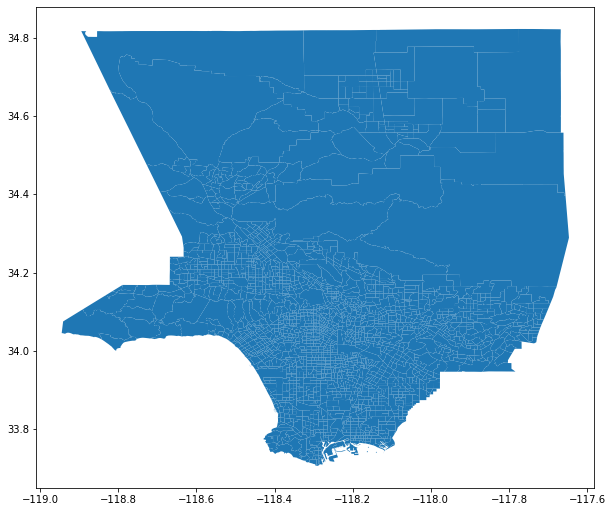

In [17]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 20))
la_gdf.plot(ax=ax)
plt.show()

<hr style="border-top: 2px solid black;">

# Create a Cleuropleth of the LA County 2010 Census Median Household Income

In [18]:
# Import new dataset that contains median household income
new_file = "data/CENSUS_TRACTS_2010_MEDHINC/CENSUS_TRACTS_2010_MEDHINC.shp"
la_median_income_gdf = gpd.read_file(new_file)

# Inspect data

In [19]:
la_median_income_gdf.head(3)

,GEOID10,CT10,LABEL,X_Center,Y_Center,MEDHINC,SHAPE_STAr,SHAPE_STLe,geometry
0,06037911001,911001,9110.01,6620403.0,1998891.0,51339.0,4.025736e+09,353933.808192,"POLYGON ((6661890.013 2025618.301, 6661890.061..."
1,06037980003,980003,9800.03,6575300.0,2112006.0,0.0,2.078690e+09,273188.863210,"POLYGON ((6597523.249 2100300.409, 6596954.119..."
2,06037930301,930301,9303.01,6603027.0,1932124.0,82167.0,1.111802e+10,628603.531323,"POLYGON ((6665669.120 1967117.056, 6665686.224..."


<hr style="border-top: 2px solid black;">

# Change the Coordinate Reference System to 4326 and Create a Subset Dataframe

In [20]:
# The 4326 epsg systen uses latitude and longitude for next visualization step
la_median_income_gdf = la_median_income_gdf.to_crs(epsg=4326)

In [21]:
# Subset geodataframe for relevant columns
columns = ['CT10', 'LABEL', 'MEDHINC']
la_median_gdf = la_median_income_gdf[columns]

# <hr style="border-top: 2px solid black;">

# Join Median Income Geodataframe with LA County Census GeoDataframe

 - use dataframe.merge() method

In [22]:
# Join/Merge data
joined_gpdf = la_gdf.merge(la_median_gdf, on=['CT10', 'LABEL'], how='left')

In [23]:
# Inspect Data
joined_gpdf.head(3)

,OBJECTID,GEOID10,CT10,LABEL,X_Center,Y_Center,Shape_STAr,Shape_STLe,geometry,area,MEDHINC
0,1,06037911001,911001,9110.01,6620403.0,1998891.0,4.025736e+09,353933.808192,"POLYGON ((-117.66712 34.55801, -117.66712 34.5...",551.875442,51339.0
1,2,06037980003,980003,9800.03,6575300.0,2112006.0,2.078690e+09,273188.863210,"POLYGON ((-117.88061 34.76362, -117.88251 34.7...",287.087406,0.0
2,3,06037930301,930301,9303.01,6603027.0,1932124.0,1.111802e+10,628603.531323,"POLYGON ((-117.65524 34.39722, -117.65518 34.3...",1517.471505,82167.0


<hr style="border-top: 3px solid black;">

# Visualize Cloropleuth

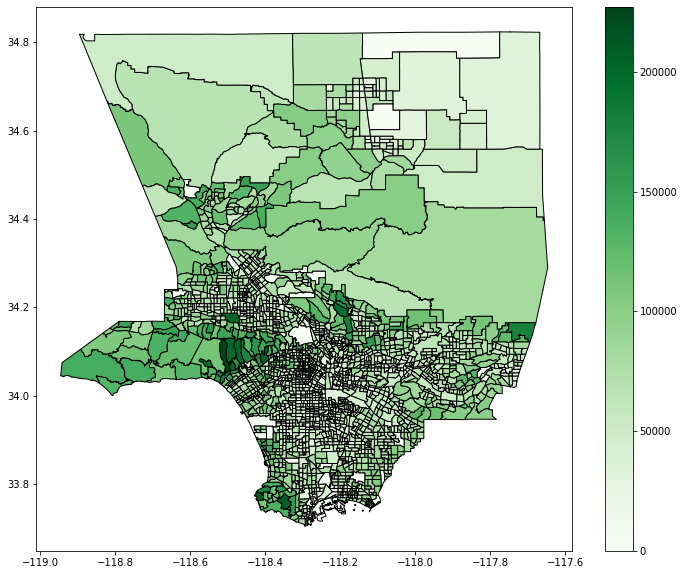

In [24]:
# subplot method that sets the figure dimensions
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 10))
# use matplotlib plot method on geodataframe, color is set by the median household income colomn
# cmap selects a green continuous color map
joined_gpdf.plot(column = 'MEDHINC', edgecolor='black',
                          cmap='Greens', legend='True' ,ax=ax)
ax.set_aspect('auto')
plt.show()

<div style="border:1px solid black; padding:10px">
<font color="blue">Note:</font><br>
 - The areas that are darker green are those with a higher median household income.
 - Some of the CT are too small to inspect using this static method.
 - May consider filtering using folium
</div>

<hr style="border-top: 3px solid black;">

# Create Choropleths with Folium to Get More Information

In [25]:
# Center point and map for Los Angeles
los_angeles = [34.2822, -118.2437]
m = folium.Map(location=los_angeles, zoom_start=9)


# Define a choropleth layer for the map
m.choropleth(
geo_data=joined_gpdf,
name='geometry',
data=joined_gpdf,
columns=['LABEL', 'MEDHINC'],
key_on='feature.properties.LABEL',
fill_color='YlGn',
fill_opacity=0.75,
line_opacity=0.5,
legend_name='Median Household Income by Census Tract'
)

# Add layer control and display
folium.LayerControl().add_to(m)
display(m)

<strong>Folium Choropleths Arguments Explaines</strong>:
<ul>
<li><code>geo_data</code> - the source data for the polygons (geojson file or a GeoDataFrame)</li>
<li><code>name</code> - the name of the geometry column (or geojson property) for the polygons</li>
<li><code>data</code> - the source DataFrame or Series for the normalized data</li>    
<li><code>columns</code> - a list of columns: one that corresponds to the polygons and one thathas the value to plot</li>
<li><code>key_on</code> - a GeoJSON variable to bind the data to (always starts with feature)</li>
<li><code>fill_color</code> - polygon fill color (defaults to blue)</li>
<li><code>fill_opacity</code> - range between 0 (transparent) and 1 (completely opaque)</li>    
<li><code>line_color</code> - color of polygon border lines (defaults to black)</li>
<li><code>line_opacity</code> - range between 0 (transparent) and 1 (completely opaque)</li>
<li><code>legend_name</code> - creates a title for the legend</li>     
</ul>

<div style="border:1px solid black; padding:10px">
<font color="blue">Note:</font><br>
 - The folium map allows us to zoom into specific census tracts and get city location information.
 - This method lets us better inspect the areas by their median household income in 2010.
</div>